In [1]:
from __future__ import print_function, division
import os
import torch
import pandas as pd
from skimage import io, transform
import numpy as np
import matplotlib.pyplot as plt

# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

plt.ion()   # interactive mode

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import sys
sys.path.insert(0, '../')

In [4]:
os.environ['CUDA_VISIBLE_DEVICES'] = '1'

# Training our first DL model using CNNs

In [5]:
from torch import nn
from torch.nn import init
import torch.nn.functional as F

In [6]:
256**2/64*128*136

17825792.0

In [7]:
class CNNNet(nn.Module):

    def __init__(self, input_shape, output_shape):
        super(CNNNet, self).__init__()
        
        self.output_shape = output_shape
        self.input_shape = input_shape

        C, W, H = input_shape
        P, D = output_shape

        self.features = nn.Sequential(
            nn.Conv2d(C, 32, (3, 3), padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d((2, 2)),
            nn.Conv2d(32, 64, (3, 3), padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d((2, 2)),
            nn.Conv2d(64, 128, (3, 3), padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d((2, 2)),
            nn.Conv2d(128, 256, (3, 3), padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d((2, 2)),
        )

        self.classifier = nn.Sequential(
            nn.Linear(H/16*256), 256),
            nn.ReLU(inplace=True),
            nn.Linear(256, P*D)
        )

    def forward(self, x):    
        C, W, H = self.input_shape
        P, D = self.output_shape
        
        x = self.features(x)
        
        x = x.view(-1, int(W/16*H/16*256))
        
        x = self.classifier(x)
        
        return x.view(-1, P, D)


## Loading the dataset and splitting between train and valid

In [8]:
from cpe775.dataset import CroppedFaceLandmarksDataset, FaceLandmarksDataset
from torch.utils.data.sampler import SubsetRandomSampler
from torchvision.transforms import Compose
from cpe775.transforms import ToTensor, CropFace, ToGray, ToPILImage

In [9]:
batch_size = 32
random_seed = 42
valid_size = 0.2
shuffle = True

In [10]:
transforms = Compose([
                   ToPILImage(),
                   ToGray(),
                   ToTensor()
                 ])

In [11]:
# load the dataset
train_dataset = CroppedFaceLandmarksDataset(data_file='../data/train.npz',
                                            transform=transforms)
valid_dataset = CroppedFaceLandmarksDataset(data_file='../data/train.npz',
                                            transform=transforms)

num_train = len(train_dataset)
indices = list(range(num_train))
split = int(np.floor(valid_size * num_train))

if shuffle == True:
    np.random.seed(random_seed)
    np.random.shuffle(indices)

train_idx, valid_idx = indices[split:], indices[:split]

train_sampler = SubsetRandomSampler(train_idx)
valid_sampler = SubsetRandomSampler(valid_idx)

train_loader = torch.utils.data.DataLoader(train_dataset, 
                batch_size=batch_size, sampler=train_sampler, num_workers=4)

valid_loader = torch.utils.data.DataLoader(valid_dataset, 
                batch_size=batch_size, sampler=valid_sampler, num_workers=4)

## Creating the model

In [12]:
net = CNNNet((1, 256, 256), (68, 2)) # input shape, output shape

In [13]:
net = torch.nn.DataParallel(net)
net = net.cuda()

In [14]:
np.sum([v.numel() for v in net.parameters()])

17200264

## Creating the loss function

In [15]:
import torch
from cpe775.criterion import NRMSELoss
from cpe775.model import Model
from cpe775 import callbacks

In [16]:
criterion = NRMSELoss()
criterion = criterion.cuda()

In [17]:
optimizer = torch.optim.SGD(net.parameters(), 0.01, momentum=0.9)
model = Model(net, criterion=criterion)
model.set_optimizer(optimizer)

## Training

In [18]:
callback_list = [
        callbacks.Progbar(print_freq=40),
        callbacks.ModelCheckpoint('../results/cnnnet/checkpoint.pth.tar', 'val_loss', mode='min')
    ]

In [19]:
model.fit_loader(train_loader, 1000, val_loader=valid_loader,
                 callback=callbacks.Compose(callback_list), metrics={'rmse': NRMSELoss(weight=68)})

Epoch: [0][0/79]	Time 0.946 (0.946)	Data 0.096 (0.096)	Train Loss 2.915 (2.915)	Train Rmse 198.197 (198.197)	
Epoch: [0][40/79]	Time 0.071 (0.093)	Data 0.001 (0.003)	Train Loss 0.332 (1.002)	Train Rmse 22.564 (68.110)	
Val: [0/20]	Time 0.149 (0.149)	Data 0.123 (0.123)	Val Loss 0.328 (0.328)	Val Rmse 22.316 (22.316)	
Epoch: [1][0/79]	Time 0.203 (0.203)	Data 0.172 (0.172)	Train Loss 0.309 (0.309)	Train Rmse 21.022 (21.022)	
Epoch: [1][40/79]	Time 0.071 (0.075)	Data 0.001 (0.005)	Train Loss 0.371 (0.286)	Train Rmse 25.224 (19.446)	
Val: [0/20]	Time 0.146 (0.146)	Data 0.119 (0.119)	Val Loss 0.286 (0.286)	Val Rmse 19.416 (19.416)	
Epoch: [2][0/79]	Time 0.173 (0.173)	Data 0.143 (0.143)	Train Loss 0.271 (0.271)	Train Rmse 18.395 (18.395)	
Epoch: [2][40/79]	Time 0.071 (0.074)	Data 0.001 (0.004)	Train Loss 0.251 (0.291)	Train Rmse 17.097 (19.762)	
Val: [0/20]	Time 0.154 (0.154)	Data 0.127 (0.127)	Val Loss 0.237 (0.237)	Val Rmse 16.087 (16.087)	
Epoch: [3][0/79]	Time 0.159 (0.159)	Data 0.130 (0.

Epoch: [26][40/79]	Time 0.075 (0.075)	Data 0.001 (0.004)	Train Loss 0.095 (0.086)	Train Rmse 6.457 (5.860)	
Val: [0/20]	Time 0.152 (0.152)	Data 0.125 (0.125)	Val Loss 0.091 (0.091)	Val Rmse 6.195 (6.195)	
Epoch: [27][0/79]	Time 0.150 (0.150)	Data 0.122 (0.122)	Train Loss 0.073 (0.073)	Train Rmse 4.961 (4.961)	
Epoch: [27][40/79]	Time 0.075 (0.076)	Data 0.001 (0.004)	Train Loss 0.107 (0.088)	Train Rmse 7.309 (5.974)	
Val: [0/20]	Time 0.154 (0.154)	Data 0.126 (0.126)	Val Loss 0.125 (0.125)	Val Rmse 8.496 (8.496)	
Epoch: [28][0/79]	Time 0.155 (0.155)	Data 0.125 (0.125)	Train Loss 0.122 (0.122)	Train Rmse 8.308 (8.308)	
Epoch: [28][40/79]	Time 0.075 (0.076)	Data 0.001 (0.004)	Train Loss 0.075 (0.096)	Train Rmse 5.089 (6.500)	
Val: [0/20]	Time 0.148 (0.148)	Data 0.121 (0.121)	Val Loss 0.110 (0.110)	Val Rmse 7.462 (7.462)	
Epoch: [29][0/79]	Time 0.154 (0.154)	Data 0.124 (0.124)	Train Loss 0.085 (0.085)	Train Rmse 5.763 (5.763)	
Epoch: [29][40/79]	Time 0.074 (0.076)	Data 0.001 (0.004)	Train L

Val: [0/20]	Time 0.159 (0.159)	Data 0.132 (0.132)	Val Loss 0.100 (0.100)	Val Rmse 6.769 (6.769)	
Epoch: [53][0/79]	Time 0.163 (0.163)	Data 0.132 (0.132)	Train Loss 0.048 (0.048)	Train Rmse 3.256 (3.256)	
Epoch: [53][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.046 (0.046)	Train Rmse 3.098 (3.127)	
Val: [0/20]	Time 0.145 (0.145)	Data 0.118 (0.118)	Val Loss 0.106 (0.106)	Val Rmse 7.175 (7.175)	
Epoch: [54][0/79]	Time 0.157 (0.157)	Data 0.127 (0.127)	Train Loss 0.054 (0.054)	Train Rmse 3.671 (3.671)	
Epoch: [54][40/79]	Time 0.074 (0.076)	Data 0.001 (0.004)	Train Loss 0.066 (0.050)	Train Rmse 4.518 (3.428)	
Val: [0/20]	Time 0.148 (0.148)	Data 0.121 (0.121)	Val Loss 0.087 (0.087)	Val Rmse 5.902 (5.902)	
Epoch: [55][0/79]	Time 0.192 (0.192)	Data 0.161 (0.161)	Train Loss 0.044 (0.044)	Train Rmse 3.002 (3.002)	
Epoch: [55][40/79]	Time 0.075 (0.077)	Data 0.001 (0.005)	Train Loss 0.042 (0.045)	Train Rmse 2.869 (3.036)	
Val: [0/20]	Time 0.143 (0.143)	Data 0.116 (0.116)	Val Loss 0.089

Epoch: [79][0/79]	Time 0.157 (0.157)	Data 0.127 (0.127)	Train Loss 0.028 (0.028)	Train Rmse 1.924 (1.924)	
Epoch: [79][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.028 (0.029)	Train Rmse 1.913 (1.941)	
Val: [0/20]	Time 0.163 (0.163)	Data 0.136 (0.136)	Val Loss 0.095 (0.095)	Val Rmse 6.445 (6.445)	
Epoch: [80][0/79]	Time 0.165 (0.165)	Data 0.134 (0.134)	Train Loss 0.033 (0.033)	Train Rmse 2.231 (2.231)	
Epoch: [80][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.029 (0.029)	Train Rmse 1.982 (1.988)	
Val: [0/20]	Time 0.146 (0.146)	Data 0.119 (0.119)	Val Loss 0.095 (0.095)	Val Rmse 6.447 (6.447)	
Epoch: [81][0/79]	Time 0.155 (0.155)	Data 0.126 (0.126)	Train Loss 0.033 (0.033)	Train Rmse 2.240 (2.240)	
Epoch: [81][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.027 (0.030)	Train Rmse 1.828 (2.056)	
Val: [0/20]	Time 0.169 (0.169)	Data 0.141 (0.141)	Val Loss 0.100 (0.100)	Val Rmse 6.814 (6.814)	
Epoch: [82][0/79]	Time 0.164 (0.164)	Data 0.134 (0.134)	Train Lo

Epoch: [105][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.026 (0.025)	Train Rmse 1.800 (1.695)	
Val: [0/20]	Time 0.150 (0.150)	Data 0.123 (0.123)	Val Loss 0.085 (0.085)	Val Rmse 5.776 (5.776)	
Epoch: [106][0/79]	Time 0.181 (0.181)	Data 0.151 (0.151)	Train Loss 0.023 (0.023)	Train Rmse 1.594 (1.594)	
Epoch: [106][40/79]	Time 0.076 (0.077)	Data 0.001 (0.005)	Train Loss 0.022 (0.023)	Train Rmse 1.498 (1.584)	
Val: [0/20]	Time 0.171 (0.171)	Data 0.144 (0.144)	Val Loss 0.095 (0.095)	Val Rmse 6.475 (6.475)	
Epoch: [107][0/79]	Time 0.150 (0.150)	Data 0.121 (0.121)	Train Loss 0.022 (0.022)	Train Rmse 1.468 (1.468)	
Epoch: [107][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.026 (0.023)	Train Rmse 1.756 (1.570)	
Val: [0/20]	Time 0.151 (0.151)	Data 0.123 (0.123)	Val Loss 0.086 (0.086)	Val Rmse 5.848 (5.848)	
Epoch: [108][0/79]	Time 0.164 (0.164)	Data 0.133 (0.133)	Train Loss 0.022 (0.022)	Train Rmse 1.474 (1.474)	
Epoch: [108][40/79]	Time 0.076 (0.077)	Data 0.001 (0.004)	

Val: [0/20]	Time 0.145 (0.145)	Data 0.118 (0.118)	Val Loss 0.087 (0.087)	Val Rmse 5.926 (5.926)	
Epoch: [132][0/79]	Time 0.150 (0.150)	Data 0.120 (0.120)	Train Loss 0.019 (0.019)	Train Rmse 1.272 (1.272)	
Epoch: [132][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.018 (0.018)	Train Rmse 1.212 (1.234)	
Val: [0/20]	Time 0.157 (0.157)	Data 0.129 (0.129)	Val Loss 0.099 (0.099)	Val Rmse 6.735 (6.735)	
Epoch: [133][0/79]	Time 0.177 (0.177)	Data 0.147 (0.147)	Train Loss 0.021 (0.021)	Train Rmse 1.431 (1.431)	
Epoch: [133][40/79]	Time 0.075 (0.078)	Data 0.001 (0.004)	Train Loss 0.018 (0.019)	Train Rmse 1.249 (1.309)	
Val: [0/20]	Time 0.143 (0.143)	Data 0.116 (0.116)	Val Loss 0.089 (0.089)	Val Rmse 6.022 (6.022)	
Epoch: [134][0/79]	Time 0.160 (0.160)	Data 0.130 (0.130)	Train Loss 0.022 (0.022)	Train Rmse 1.478 (1.478)	
Epoch: [134][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.019 (0.019)	Train Rmse 1.281 (1.319)	
Val: [0/20]	Time 0.146 (0.146)	Data 0.118 (0.118)	Val Loss

Epoch: [158][0/79]	Time 0.182 (0.182)	Data 0.150 (0.150)	Train Loss 0.017 (0.017)	Train Rmse 1.150 (1.150)	
Epoch: [158][40/79]	Time 0.075 (0.078)	Data 0.001 (0.005)	Train Loss 0.016 (0.018)	Train Rmse 1.121 (1.191)	
Val: [0/20]	Time 0.147 (0.147)	Data 0.119 (0.119)	Val Loss 0.093 (0.093)	Val Rmse 6.309 (6.309)	
Epoch: [159][0/79]	Time 0.169 (0.169)	Data 0.139 (0.139)	Train Loss 0.018 (0.018)	Train Rmse 1.247 (1.247)	
Epoch: [159][40/79]	Time 0.076 (0.078)	Data 0.001 (0.004)	Train Loss 0.016 (0.018)	Train Rmse 1.106 (1.228)	
Val: [0/20]	Time 0.160 (0.160)	Data 0.130 (0.130)	Val Loss 0.087 (0.087)	Val Rmse 5.930 (5.930)	
Epoch: [160][0/79]	Time 0.154 (0.154)	Data 0.124 (0.124)	Train Loss 0.016 (0.016)	Train Rmse 1.122 (1.122)	
Epoch: [160][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.019 (0.017)	Train Rmse 1.313 (1.174)	
Val: [0/20]	Time 0.155 (0.155)	Data 0.127 (0.127)	Val Loss 0.104 (0.104)	Val Rmse 7.080 (7.080)	
Epoch: [161][0/79]	Time 0.175 (0.175)	Data 0.145 (0.145)	T

Epoch: [184][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.014 (0.014)	Train Rmse 0.928 (0.974)	
Val: [0/20]	Time 0.145 (0.145)	Data 0.118 (0.118)	Val Loss 0.084 (0.084)	Val Rmse 5.697 (5.697)	
Epoch: [185][0/79]	Time 0.155 (0.155)	Data 0.126 (0.126)	Train Loss 0.015 (0.015)	Train Rmse 1.044 (1.044)	
Epoch: [185][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.015 (0.015)	Train Rmse 1.011 (0.990)	
Val: [0/20]	Time 0.154 (0.154)	Data 0.126 (0.126)	Val Loss 0.089 (0.089)	Val Rmse 6.045 (6.045)	
Epoch: [186][0/79]	Time 0.171 (0.171)	Data 0.141 (0.141)	Train Loss 0.015 (0.015)	Train Rmse 0.996 (0.996)	
Epoch: [186][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.016 (0.015)	Train Rmse 1.106 (1.007)	
Val: [0/20]	Time 0.146 (0.146)	Data 0.119 (0.119)	Val Loss 0.095 (0.095)	Val Rmse 6.473 (6.473)	
Epoch: [187][0/79]	Time 0.166 (0.166)	Data 0.137 (0.137)	Train Loss 0.014 (0.014)	Train Rmse 0.969 (0.969)	
Epoch: [187][40/79]	Time 0.076 (0.077)	Data 0.001 (0.004)	

Val: [0/20]	Time 0.147 (0.147)	Data 0.119 (0.119)	Val Loss 0.098 (0.098)	Val Rmse 6.643 (6.643)	
Epoch: [211][0/79]	Time 0.186 (0.186)	Data 0.155 (0.155)	Train Loss 0.013 (0.013)	Train Rmse 0.915 (0.915)	
Epoch: [211][40/79]	Time 0.076 (0.078)	Data 0.001 (0.005)	Train Loss 0.014 (0.014)	Train Rmse 0.976 (0.946)	
Val: [0/20]	Time 0.152 (0.152)	Data 0.124 (0.124)	Val Loss 0.088 (0.088)	Val Rmse 5.991 (5.991)	
Epoch: [212][0/79]	Time 0.156 (0.156)	Data 0.126 (0.126)	Train Loss 0.014 (0.014)	Train Rmse 0.934 (0.934)	
Epoch: [212][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.012 (0.014)	Train Rmse 0.795 (0.934)	
Val: [0/20]	Time 0.151 (0.151)	Data 0.123 (0.123)	Val Loss 0.086 (0.086)	Val Rmse 5.848 (5.848)	
Epoch: [213][0/79]	Time 0.188 (0.188)	Data 0.159 (0.159)	Train Loss 0.012 (0.012)	Train Rmse 0.846 (0.846)	
Epoch: [213][40/79]	Time 0.075 (0.078)	Data 0.001 (0.005)	Train Loss 0.013 (0.013)	Train Rmse 0.914 (0.917)	
Val: [0/20]	Time 0.146 (0.146)	Data 0.118 (0.118)	Val Loss

Epoch: [237][0/79]	Time 0.197 (0.197)	Data 0.168 (0.168)	Train Loss 0.014 (0.014)	Train Rmse 0.938 (0.938)	
Epoch: [237][40/79]	Time 0.075 (0.078)	Data 0.001 (0.005)	Train Loss 0.012 (0.013)	Train Rmse 0.831 (0.917)	
Val: [0/20]	Time 0.146 (0.146)	Data 0.118 (0.118)	Val Loss 0.091 (0.091)	Val Rmse 6.208 (6.208)	
Epoch: [238][0/79]	Time 0.164 (0.164)	Data 0.133 (0.133)	Train Loss 0.013 (0.013)	Train Rmse 0.911 (0.911)	
Epoch: [238][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.014 (0.013)	Train Rmse 0.980 (0.894)	
Val: [0/20]	Time 0.161 (0.161)	Data 0.134 (0.134)	Val Loss 0.082 (0.082)	Val Rmse 5.597 (5.597)	
Epoch: [239][0/79]	Time 0.161 (0.161)	Data 0.129 (0.129)	Train Loss 0.012 (0.012)	Train Rmse 0.808 (0.808)	
Epoch: [239][40/79]	Time 0.074 (0.076)	Data 0.001 (0.004)	Train Loss 0.012 (0.012)	Train Rmse 0.802 (0.842)	
Val: [0/20]	Time 0.145 (0.145)	Data 0.118 (0.118)	Val Loss 0.092 (0.092)	Val Rmse 6.228 (6.228)	
Epoch: [240][0/79]	Time 0.165 (0.165)	Data 0.134 (0.134)	T

Epoch: [263][40/79]	Time 0.074 (0.077)	Data 0.001 (0.004)	Train Loss 0.012 (0.012)	Train Rmse 0.791 (0.809)	
Val: [0/20]	Time 0.146 (0.146)	Data 0.119 (0.119)	Val Loss 0.084 (0.084)	Val Rmse 5.696 (5.696)	
Epoch: [264][0/79]	Time 0.146 (0.146)	Data 0.117 (0.117)	Train Loss 0.012 (0.012)	Train Rmse 0.793 (0.793)	
Epoch: [264][40/79]	Time 0.076 (0.077)	Data 0.001 (0.004)	Train Loss 0.012 (0.012)	Train Rmse 0.847 (0.786)	
Val: [0/20]	Time 0.148 (0.148)	Data 0.120 (0.120)	Val Loss 0.090 (0.090)	Val Rmse 6.130 (6.130)	
Epoch: [265][0/79]	Time 0.153 (0.153)	Data 0.124 (0.124)	Train Loss 0.012 (0.012)	Train Rmse 0.842 (0.842)	
Epoch: [265][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.013 (0.012)	Train Rmse 0.898 (0.836)	
Val: [0/20]	Time 0.151 (0.151)	Data 0.124 (0.124)	Val Loss 0.099 (0.099)	Val Rmse 6.746 (6.746)	
Epoch: [266][0/79]	Time 0.181 (0.181)	Data 0.150 (0.150)	Train Loss 0.013 (0.013)	Train Rmse 0.878 (0.878)	
Epoch: [266][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	

Val: [0/20]	Time 0.151 (0.151)	Data 0.123 (0.123)	Val Loss 0.097 (0.097)	Val Rmse 6.577 (6.577)	
Epoch: [290][0/79]	Time 0.148 (0.148)	Data 0.118 (0.118)	Train Loss 0.010 (0.010)	Train Rmse 0.679 (0.679)	
Epoch: [290][40/79]	Time 0.076 (0.077)	Data 0.001 (0.004)	Train Loss 0.011 (0.011)	Train Rmse 0.777 (0.722)	
Val: [0/20]	Time 0.159 (0.159)	Data 0.131 (0.131)	Val Loss 0.080 (0.080)	Val Rmse 5.454 (5.454)	
Epoch: [291][0/79]	Time 0.159 (0.159)	Data 0.129 (0.129)	Train Loss 0.011 (0.011)	Train Rmse 0.721 (0.721)	
Epoch: [291][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.010 (0.011)	Train Rmse 0.661 (0.735)	
Val: [0/20]	Time 0.146 (0.146)	Data 0.118 (0.118)	Val Loss 0.082 (0.082)	Val Rmse 5.568 (5.568)	
Epoch: [292][0/79]	Time 0.187 (0.187)	Data 0.157 (0.157)	Train Loss 0.011 (0.011)	Train Rmse 0.732 (0.732)	
Epoch: [292][40/79]	Time 0.076 (0.077)	Data 0.001 (0.005)	Train Loss 0.012 (0.011)	Train Rmse 0.808 (0.755)	
Val: [0/20]	Time 0.161 (0.161)	Data 0.132 (0.132)	Val Loss

Epoch: [316][0/79]	Time 0.163 (0.163)	Data 0.133 (0.133)	Train Loss 0.010 (0.010)	Train Rmse 0.701 (0.701)	
Epoch: [316][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.010 (0.011)	Train Rmse 0.705 (0.748)	
Val: [0/20]	Time 0.148 (0.148)	Data 0.121 (0.121)	Val Loss 0.094 (0.094)	Val Rmse 6.367 (6.367)	
Epoch: [317][0/79]	Time 0.159 (0.159)	Data 0.129 (0.129)	Train Loss 0.011 (0.011)	Train Rmse 0.764 (0.764)	
Epoch: [317][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.011 (0.011)	Train Rmse 0.729 (0.736)	
Val: [0/20]	Time 0.170 (0.170)	Data 0.142 (0.142)	Val Loss 0.094 (0.094)	Val Rmse 6.420 (6.420)	
Epoch: [318][0/79]	Time 0.164 (0.164)	Data 0.134 (0.134)	Train Loss 0.010 (0.010)	Train Rmse 0.700 (0.700)	
Epoch: [318][40/79]	Time 0.075 (0.076)	Data 0.001 (0.004)	Train Loss 0.011 (0.012)	Train Rmse 0.761 (0.786)	
Val: [0/20]	Time 0.144 (0.144)	Data 0.117 (0.117)	Val Loss 0.097 (0.097)	Val Rmse 6.563 (6.563)	
Epoch: [319][0/79]	Time 0.151 (0.151)	Data 0.120 (0.120)	T

Epoch: [342][40/79]	Time 0.075 (0.076)	Data 0.001 (0.004)	Train Loss 0.011 (0.010)	Train Rmse 0.719 (0.685)	
Val: [0/20]	Time 0.163 (0.163)	Data 0.135 (0.135)	Val Loss 0.090 (0.090)	Val Rmse 6.115 (6.115)	
Epoch: [343][0/79]	Time 0.146 (0.146)	Data 0.117 (0.117)	Train Loss 0.011 (0.011)	Train Rmse 0.719 (0.719)	
Epoch: [343][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.010 (0.010)	Train Rmse 0.691 (0.702)	
Val: [0/20]	Time 0.150 (0.150)	Data 0.124 (0.124)	Val Loss 0.084 (0.084)	Val Rmse 5.716 (5.716)	
Epoch: [344][0/79]	Time 0.157 (0.157)	Data 0.127 (0.127)	Train Loss 0.010 (0.010)	Train Rmse 0.663 (0.663)	
Epoch: [344][40/79]	Time 0.076 (0.077)	Data 0.001 (0.004)	Train Loss 0.009 (0.010)	Train Rmse 0.631 (0.691)	
Val: [0/20]	Time 0.151 (0.151)	Data 0.123 (0.123)	Val Loss 0.090 (0.090)	Val Rmse 6.106 (6.106)	
Epoch: [345][0/79]	Time 0.150 (0.150)	Data 0.119 (0.119)	Train Loss 0.010 (0.010)	Train Rmse 0.708 (0.708)	
Epoch: [345][40/79]	Time 0.076 (0.077)	Data 0.001 (0.004)	

Val: [0/20]	Time 0.188 (0.188)	Data 0.160 (0.160)	Val Loss 0.083 (0.083)	Val Rmse 5.642 (5.642)	
Epoch: [369][0/79]	Time 0.153 (0.153)	Data 0.123 (0.123)	Train Loss 0.013 (0.013)	Train Rmse 0.861 (0.861)	
Epoch: [369][40/79]	Time 0.076 (0.077)	Data 0.001 (0.004)	Train Loss 0.010 (0.010)	Train Rmse 0.663 (0.695)	
Val: [0/20]	Time 0.147 (0.147)	Data 0.119 (0.119)	Val Loss 0.101 (0.101)	Val Rmse 6.856 (6.856)	
Epoch: [370][0/79]	Time 0.152 (0.152)	Data 0.123 (0.123)	Train Loss 0.010 (0.010)	Train Rmse 0.647 (0.647)	
Epoch: [370][40/79]	Time 0.075 (0.076)	Data 0.001 (0.004)	Train Loss 0.009 (0.010)	Train Rmse 0.636 (0.703)	
Val: [0/20]	Time 0.152 (0.152)	Data 0.124 (0.124)	Val Loss 0.086 (0.086)	Val Rmse 5.865 (5.865)	
Epoch: [371][0/79]	Time 0.150 (0.150)	Data 0.121 (0.121)	Train Loss 0.010 (0.010)	Train Rmse 0.669 (0.669)	
Epoch: [371][40/79]	Time 0.076 (0.077)	Data 0.001 (0.004)	Train Loss 0.010 (0.010)	Train Rmse 0.657 (0.667)	
Val: [0/20]	Time 0.155 (0.155)	Data 0.128 (0.128)	Val Loss

Epoch: [395][0/79]	Time 0.167 (0.167)	Data 0.136 (0.136)	Train Loss 0.009 (0.009)	Train Rmse 0.627 (0.627)	
Epoch: [395][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.010 (0.010)	Train Rmse 0.700 (0.667)	
Val: [0/20]	Time 0.151 (0.151)	Data 0.123 (0.123)	Val Loss 0.083 (0.083)	Val Rmse 5.660 (5.660)	
Epoch: [396][0/79]	Time 0.152 (0.152)	Data 0.122 (0.122)	Train Loss 0.011 (0.011)	Train Rmse 0.765 (0.765)	
Epoch: [396][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.010 (0.010)	Train Rmse 0.660 (0.690)	
Val: [0/20]	Time 0.144 (0.144)	Data 0.117 (0.117)	Val Loss 0.111 (0.111)	Val Rmse 7.525 (7.525)	
Epoch: [397][0/79]	Time 0.170 (0.170)	Data 0.141 (0.141)	Train Loss 0.010 (0.010)	Train Rmse 0.689 (0.689)	
Epoch: [397][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.010 (0.010)	Train Rmse 0.689 (0.677)	
Val: [0/20]	Time 0.147 (0.147)	Data 0.120 (0.120)	Val Loss 0.081 (0.081)	Val Rmse 5.524 (5.524)	
Epoch: [398][0/79]	Time 0.149 (0.149)	Data 0.119 (0.119)	T

Epoch: [421][40/79]	Time 0.075 (0.076)	Data 0.001 (0.004)	Train Loss 0.009 (0.009)	Train Rmse 0.596 (0.610)	
Val: [0/20]	Time 0.145 (0.145)	Data 0.117 (0.117)	Val Loss 0.094 (0.094)	Val Rmse 6.418 (6.418)	
Epoch: [422][0/79]	Time 0.179 (0.179)	Data 0.147 (0.147)	Train Loss 0.010 (0.010)	Train Rmse 0.655 (0.655)	
Epoch: [422][40/79]	Time 0.075 (0.078)	Data 0.001 (0.005)	Train Loss 0.009 (0.009)	Train Rmse 0.598 (0.646)	
Val: [0/20]	Time 0.153 (0.153)	Data 0.125 (0.125)	Val Loss 0.092 (0.092)	Val Rmse 6.248 (6.248)	
Epoch: [423][0/79]	Time 0.156 (0.156)	Data 0.126 (0.126)	Train Loss 0.009 (0.009)	Train Rmse 0.631 (0.631)	
Epoch: [423][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.009 (0.010)	Train Rmse 0.584 (0.646)	
Val: [0/20]	Time 0.161 (0.161)	Data 0.132 (0.132)	Val Loss 0.091 (0.091)	Val Rmse 6.171 (6.171)	
Epoch: [424][0/79]	Time 0.168 (0.168)	Data 0.137 (0.137)	Train Loss 0.009 (0.009)	Train Rmse 0.630 (0.630)	
Epoch: [424][40/79]	Time 0.076 (0.077)	Data 0.001 (0.004)	

Val: [0/20]	Time 0.149 (0.149)	Data 0.120 (0.120)	Val Loss 0.089 (0.089)	Val Rmse 6.038 (6.038)	
Epoch: [448][0/79]	Time 0.153 (0.153)	Data 0.124 (0.124)	Train Loss 0.009 (0.009)	Train Rmse 0.627 (0.627)	
Epoch: [448][40/79]	Time 0.076 (0.077)	Data 0.001 (0.004)	Train Loss 0.009 (0.009)	Train Rmse 0.591 (0.587)	
Val: [0/20]	Time 0.154 (0.154)	Data 0.126 (0.126)	Val Loss 0.085 (0.085)	Val Rmse 5.784 (5.784)	
Epoch: [449][0/79]	Time 0.152 (0.152)	Data 0.122 (0.122)	Train Loss 0.009 (0.009)	Train Rmse 0.592 (0.592)	
Epoch: [449][40/79]	Time 0.074 (0.077)	Data 0.001 (0.004)	Train Loss 0.008 (0.009)	Train Rmse 0.553 (0.579)	
Val: [0/20]	Time 0.155 (0.155)	Data 0.128 (0.128)	Val Loss 0.084 (0.084)	Val Rmse 5.699 (5.699)	
Epoch: [450][0/79]	Time 0.179 (0.179)	Data 0.148 (0.148)	Train Loss 0.009 (0.009)	Train Rmse 0.585 (0.585)	
Epoch: [450][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.008 (0.008)	Train Rmse 0.550 (0.565)	
Val: [0/20]	Time 0.147 (0.147)	Data 0.119 (0.119)	Val Loss

Epoch: [474][0/79]	Time 0.150 (0.150)	Data 0.119 (0.119)	Train Loss 0.009 (0.009)	Train Rmse 0.619 (0.619)	
Epoch: [474][40/79]	Time 0.075 (0.076)	Data 0.001 (0.004)	Train Loss 0.009 (0.009)	Train Rmse 0.633 (0.640)	
Val: [0/20]	Time 0.150 (0.150)	Data 0.122 (0.122)	Val Loss 0.081 (0.081)	Val Rmse 5.480 (5.480)	
Epoch: [475][0/79]	Time 0.158 (0.158)	Data 0.128 (0.128)	Train Loss 0.009 (0.009)	Train Rmse 0.579 (0.579)	
Epoch: [475][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.009 (0.009)	Train Rmse 0.586 (0.588)	
Val: [0/20]	Time 0.162 (0.162)	Data 0.134 (0.134)	Val Loss 0.099 (0.099)	Val Rmse 6.727 (6.727)	
Epoch: [476][0/79]	Time 0.174 (0.174)	Data 0.145 (0.145)	Train Loss 0.008 (0.008)	Train Rmse 0.559 (0.559)	
Epoch: [476][40/79]	Time 0.076 (0.077)	Data 0.001 (0.004)	Train Loss 0.008 (0.009)	Train Rmse 0.553 (0.579)	
Val: [0/20]	Time 0.151 (0.151)	Data 0.124 (0.124)	Val Loss 0.088 (0.088)	Val Rmse 5.977 (5.977)	
Epoch: [477][0/79]	Time 0.166 (0.166)	Data 0.136 (0.136)	T

Epoch: [500][40/79]	Time 0.076 (0.077)	Data 0.001 (0.004)	Train Loss 0.008 (0.008)	Train Rmse 0.562 (0.572)	
Val: [0/20]	Time 0.155 (0.155)	Data 0.127 (0.127)	Val Loss 0.079 (0.079)	Val Rmse 5.384 (5.384)	
Epoch: [501][0/79]	Time 0.150 (0.150)	Data 0.120 (0.120)	Train Loss 0.009 (0.009)	Train Rmse 0.581 (0.581)	
Epoch: [501][40/79]	Time 0.075 (0.076)	Data 0.001 (0.004)	Train Loss 0.008 (0.008)	Train Rmse 0.548 (0.566)	
Val: [0/20]	Time 0.160 (0.160)	Data 0.132 (0.132)	Val Loss 0.101 (0.101)	Val Rmse 6.846 (6.846)	
Epoch: [502][0/79]	Time 0.173 (0.173)	Data 0.144 (0.144)	Train Loss 0.007 (0.007)	Train Rmse 0.492 (0.492)	
Epoch: [502][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.008 (0.008)	Train Rmse 0.546 (0.539)	
Val: [0/20]	Time 0.148 (0.148)	Data 0.120 (0.120)	Val Loss 0.092 (0.092)	Val Rmse 6.257 (6.257)	
Epoch: [503][0/79]	Time 0.156 (0.156)	Data 0.127 (0.127)	Train Loss 0.009 (0.009)	Train Rmse 0.637 (0.637)	
Epoch: [503][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	

Val: [0/20]	Time 0.144 (0.144)	Data 0.117 (0.117)	Val Loss 0.082 (0.082)	Val Rmse 5.599 (5.599)	
Epoch: [527][0/79]	Time 0.150 (0.150)	Data 0.120 (0.120)	Train Loss 0.009 (0.009)	Train Rmse 0.593 (0.593)	
Epoch: [527][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.008 (0.009)	Train Rmse 0.575 (0.586)	
Val: [0/20]	Time 0.149 (0.149)	Data 0.122 (0.122)	Val Loss 0.089 (0.089)	Val Rmse 6.071 (6.071)	
Epoch: [528][0/79]	Time 0.164 (0.164)	Data 0.133 (0.133)	Train Loss 0.009 (0.009)	Train Rmse 0.613 (0.613)	
Epoch: [528][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.008 (0.008)	Train Rmse 0.548 (0.536)	
Val: [0/20]	Time 0.150 (0.150)	Data 0.123 (0.123)	Val Loss 0.104 (0.104)	Val Rmse 7.049 (7.049)	
Epoch: [529][0/79]	Time 0.200 (0.200)	Data 0.171 (0.171)	Train Loss 0.008 (0.008)	Train Rmse 0.541 (0.541)	
Epoch: [529][40/79]	Time 0.075 (0.078)	Data 0.001 (0.005)	Train Loss 0.008 (0.009)	Train Rmse 0.548 (0.580)	
Val: [0/20]	Time 0.156 (0.156)	Data 0.128 (0.128)	Val Loss

Epoch: [553][0/79]	Time 0.161 (0.161)	Data 0.132 (0.132)	Train Loss 0.008 (0.008)	Train Rmse 0.567 (0.567)	
Epoch: [553][40/79]	Time 0.076 (0.077)	Data 0.001 (0.004)	Train Loss 0.008 (0.008)	Train Rmse 0.549 (0.573)	
Val: [0/20]	Time 0.144 (0.144)	Data 0.117 (0.117)	Val Loss 0.083 (0.083)	Val Rmse 5.667 (5.667)	
Epoch: [554][0/79]	Time 0.171 (0.171)	Data 0.140 (0.140)	Train Loss 0.009 (0.009)	Train Rmse 0.617 (0.617)	
Epoch: [554][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.008 (0.009)	Train Rmse 0.528 (0.590)	
Val: [0/20]	Time 0.162 (0.162)	Data 0.135 (0.135)	Val Loss 0.086 (0.086)	Val Rmse 5.861 (5.861)	
Epoch: [555][0/79]	Time 0.202 (0.202)	Data 0.172 (0.172)	Train Loss 0.008 (0.008)	Train Rmse 0.537 (0.537)	
Epoch: [555][40/79]	Time 0.075 (0.078)	Data 0.001 (0.005)	Train Loss 0.008 (0.008)	Train Rmse 0.563 (0.562)	
Val: [0/20]	Time 0.165 (0.165)	Data 0.137 (0.137)	Val Loss 0.083 (0.083)	Val Rmse 5.678 (5.678)	
Epoch: [556][0/79]	Time 0.160 (0.160)	Data 0.131 (0.131)	T

Epoch: [579][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.008 (0.008)	Train Rmse 0.522 (0.526)	
Val: [0/20]	Time 0.152 (0.152)	Data 0.125 (0.125)	Val Loss 0.080 (0.080)	Val Rmse 5.407 (5.407)	
Epoch: [580][0/79]	Time 0.192 (0.192)	Data 0.160 (0.160)	Train Loss 0.007 (0.007)	Train Rmse 0.469 (0.469)	
Epoch: [580][40/79]	Time 0.075 (0.078)	Data 0.001 (0.005)	Train Loss 0.007 (0.007)	Train Rmse 0.504 (0.506)	
Val: [0/20]	Time 0.159 (0.159)	Data 0.132 (0.132)	Val Loss 0.091 (0.091)	Val Rmse 6.166 (6.166)	
Epoch: [581][0/79]	Time 0.156 (0.156)	Data 0.126 (0.126)	Train Loss 0.008 (0.008)	Train Rmse 0.519 (0.519)	
Epoch: [581][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.007 (0.008)	Train Rmse 0.499 (0.546)	
Val: [0/20]	Time 0.153 (0.153)	Data 0.124 (0.124)	Val Loss 0.088 (0.088)	Val Rmse 5.956 (5.956)	
Epoch: [582][0/79]	Time 0.158 (0.158)	Data 0.128 (0.128)	Train Loss 0.008 (0.008)	Train Rmse 0.528 (0.528)	
Epoch: [582][40/79]	Time 0.076 (0.077)	Data 0.001 (0.004)	

Val: [0/20]	Time 0.152 (0.152)	Data 0.124 (0.124)	Val Loss 0.092 (0.092)	Val Rmse 6.274 (6.274)	
Epoch: [606][0/79]	Time 0.164 (0.164)	Data 0.133 (0.133)	Train Loss 0.008 (0.008)	Train Rmse 0.567 (0.567)	
Epoch: [606][40/79]	Time 0.076 (0.077)	Data 0.001 (0.004)	Train Loss 0.008 (0.008)	Train Rmse 0.519 (0.546)	
Val: [0/20]	Time 0.157 (0.157)	Data 0.130 (0.130)	Val Loss 0.103 (0.103)	Val Rmse 7.030 (7.030)	
Epoch: [607][0/79]	Time 0.161 (0.161)	Data 0.131 (0.131)	Train Loss 0.008 (0.008)	Train Rmse 0.569 (0.569)	
Epoch: [607][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.007 (0.008)	Train Rmse 0.452 (0.520)	
Val: [0/20]	Time 0.165 (0.165)	Data 0.137 (0.137)	Val Loss 0.084 (0.084)	Val Rmse 5.741 (5.741)	
Epoch: [608][0/79]	Time 0.153 (0.153)	Data 0.123 (0.123)	Train Loss 0.009 (0.009)	Train Rmse 0.611 (0.611)	
Epoch: [608][40/79]	Time 0.076 (0.077)	Data 0.001 (0.004)	Train Loss 0.008 (0.008)	Train Rmse 0.522 (0.544)	
Val: [0/20]	Time 0.151 (0.151)	Data 0.124 (0.124)	Val Loss

Epoch: [632][0/79]	Time 0.164 (0.164)	Data 0.133 (0.133)	Train Loss 0.007 (0.007)	Train Rmse 0.450 (0.450)	
Epoch: [632][40/79]	Time 0.076 (0.077)	Data 0.001 (0.004)	Train Loss 0.008 (0.007)	Train Rmse 0.517 (0.502)	
Val: [0/20]	Time 0.146 (0.146)	Data 0.118 (0.118)	Val Loss 0.095 (0.095)	Val Rmse 6.443 (6.443)	
Epoch: [633][0/79]	Time 0.165 (0.165)	Data 0.135 (0.135)	Train Loss 0.007 (0.007)	Train Rmse 0.444 (0.444)	
Epoch: [633][40/79]	Time 0.075 (0.076)	Data 0.001 (0.004)	Train Loss 0.008 (0.007)	Train Rmse 0.532 (0.505)	
Val: [0/20]	Time 0.152 (0.152)	Data 0.125 (0.125)	Val Loss 0.080 (0.080)	Val Rmse 5.452 (5.452)	
Epoch: [634][0/79]	Time 0.162 (0.162)	Data 0.132 (0.132)	Train Loss 0.008 (0.008)	Train Rmse 0.518 (0.518)	
Epoch: [634][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.007 (0.007)	Train Rmse 0.500 (0.507)	
Val: [0/20]	Time 0.170 (0.170)	Data 0.142 (0.142)	Val Loss 0.080 (0.080)	Val Rmse 5.453 (5.453)	
Epoch: [635][0/79]	Time 0.167 (0.167)	Data 0.137 (0.137)	T

Epoch: [658][40/79]	Time 0.076 (0.077)	Data 0.001 (0.004)	Train Loss 0.007 (0.007)	Train Rmse 0.461 (0.484)	
Val: [0/20]	Time 0.160 (0.160)	Data 0.131 (0.131)	Val Loss 0.097 (0.097)	Val Rmse 6.564 (6.564)	
Epoch: [659][0/79]	Time 0.180 (0.180)	Data 0.149 (0.149)	Train Loss 0.007 (0.007)	Train Rmse 0.492 (0.492)	
Epoch: [659][40/79]	Time 0.075 (0.077)	Data 0.001 (0.005)	Train Loss 0.007 (0.007)	Train Rmse 0.502 (0.483)	
Val: [0/20]	Time 0.146 (0.146)	Data 0.117 (0.117)	Val Loss 0.091 (0.091)	Val Rmse 6.205 (6.205)	
Epoch: [660][0/79]	Time 0.154 (0.154)	Data 0.124 (0.124)	Train Loss 0.007 (0.007)	Train Rmse 0.474 (0.474)	
Epoch: [660][40/79]	Time 0.075 (0.076)	Data 0.001 (0.004)	Train Loss 0.007 (0.007)	Train Rmse 0.472 (0.491)	
Val: [0/20]	Time 0.143 (0.143)	Data 0.116 (0.116)	Val Loss 0.080 (0.080)	Val Rmse 5.454 (5.454)	
Epoch: [661][0/79]	Time 0.166 (0.166)	Data 0.136 (0.136)	Train Loss 0.007 (0.007)	Train Rmse 0.443 (0.443)	
Epoch: [661][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	

Val: [0/20]	Time 0.157 (0.157)	Data 0.130 (0.130)	Val Loss 0.085 (0.085)	Val Rmse 5.778 (5.778)	
Epoch: [685][0/79]	Time 0.201 (0.201)	Data 0.171 (0.171)	Train Loss 0.007 (0.007)	Train Rmse 0.465 (0.465)	
Epoch: [685][40/79]	Time 0.075 (0.078)	Data 0.001 (0.005)	Train Loss 0.008 (0.008)	Train Rmse 0.526 (0.548)	
Val: [0/20]	Time 0.152 (0.152)	Data 0.124 (0.124)	Val Loss 0.082 (0.082)	Val Rmse 5.544 (5.544)	
Epoch: [686][0/79]	Time 0.159 (0.159)	Data 0.128 (0.128)	Train Loss 0.007 (0.007)	Train Rmse 0.463 (0.463)	
Epoch: [686][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.007 (0.008)	Train Rmse 0.494 (0.512)	
Val: [0/20]	Time 0.154 (0.154)	Data 0.126 (0.126)	Val Loss 0.088 (0.088)	Val Rmse 5.993 (5.993)	
Epoch: [687][0/79]	Time 0.167 (0.167)	Data 0.138 (0.138)	Train Loss 0.007 (0.007)	Train Rmse 0.473 (0.473)	
Epoch: [687][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.007 (0.007)	Train Rmse 0.477 (0.489)	
Val: [0/20]	Time 0.162 (0.162)	Data 0.134 (0.134)	Val Loss

Epoch: [711][0/79]	Time 0.164 (0.164)	Data 0.135 (0.135)	Train Loss 0.007 (0.007)	Train Rmse 0.454 (0.454)	
Epoch: [711][40/79]	Time 0.076 (0.077)	Data 0.001 (0.004)	Train Loss 0.006 (0.007)	Train Rmse 0.436 (0.459)	
Val: [0/20]	Time 0.153 (0.153)	Data 0.125 (0.125)	Val Loss 0.081 (0.081)	Val Rmse 5.531 (5.531)	
Epoch: [712][0/79]	Time 0.192 (0.192)	Data 0.162 (0.162)	Train Loss 0.008 (0.008)	Train Rmse 0.570 (0.570)	
Epoch: [712][40/79]	Time 0.075 (0.078)	Data 0.001 (0.005)	Train Loss 0.007 (0.007)	Train Rmse 0.506 (0.492)	
Val: [0/20]	Time 0.152 (0.152)	Data 0.124 (0.124)	Val Loss 0.099 (0.099)	Val Rmse 6.735 (6.735)	
Epoch: [713][0/79]	Time 0.190 (0.190)	Data 0.160 (0.160)	Train Loss 0.007 (0.007)	Train Rmse 0.482 (0.482)	
Epoch: [713][40/79]	Time 0.075 (0.077)	Data 0.001 (0.005)	Train Loss 0.007 (0.007)	Train Rmse 0.448 (0.479)	
Val: [0/20]	Time 0.156 (0.156)	Data 0.129 (0.129)	Val Loss 0.103 (0.103)	Val Rmse 7.016 (7.016)	
Epoch: [714][0/79]	Time 0.147 (0.147)	Data 0.117 (0.117)	T

Epoch: [737][40/79]	Time 0.075 (0.076)	Data 0.001 (0.004)	Train Loss 0.007 (0.007)	Train Rmse 0.462 (0.477)	
Val: [0/20]	Time 0.160 (0.160)	Data 0.131 (0.131)	Val Loss 0.093 (0.093)	Val Rmse 6.343 (6.343)	
Epoch: [738][0/79]	Time 0.171 (0.171)	Data 0.141 (0.141)	Train Loss 0.008 (0.008)	Train Rmse 0.543 (0.543)	
Epoch: [738][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.006 (0.007)	Train Rmse 0.428 (0.466)	
Val: [0/20]	Time 0.147 (0.147)	Data 0.119 (0.119)	Val Loss 0.078 (0.078)	Val Rmse 5.293 (5.293)	
Epoch: [739][0/79]	Time 0.152 (0.152)	Data 0.122 (0.122)	Train Loss 0.007 (0.007)	Train Rmse 0.443 (0.443)	
Epoch: [739][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.006 (0.007)	Train Rmse 0.415 (0.463)	
Val: [0/20]	Time 0.145 (0.145)	Data 0.117 (0.117)	Val Loss 0.082 (0.082)	Val Rmse 5.600 (5.600)	
Epoch: [740][0/79]	Time 0.154 (0.154)	Data 0.125 (0.125)	Train Loss 0.007 (0.007)	Train Rmse 0.450 (0.450)	
Epoch: [740][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	

Val: [0/20]	Time 0.148 (0.148)	Data 0.120 (0.120)	Val Loss 0.086 (0.086)	Val Rmse 5.856 (5.856)	
Epoch: [764][0/79]	Time 0.153 (0.153)	Data 0.122 (0.122)	Train Loss 0.007 (0.007)	Train Rmse 0.489 (0.489)	
Epoch: [764][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.006 (0.007)	Train Rmse 0.442 (0.465)	
Val: [0/20]	Time 0.147 (0.147)	Data 0.120 (0.120)	Val Loss 0.087 (0.087)	Val Rmse 5.924 (5.924)	
Epoch: [765][0/79]	Time 0.155 (0.155)	Data 0.126 (0.126)	Train Loss 0.006 (0.006)	Train Rmse 0.426 (0.426)	
Epoch: [765][40/79]	Time 0.075 (0.076)	Data 0.001 (0.004)	Train Loss 0.007 (0.007)	Train Rmse 0.498 (0.466)	
Val: [0/20]	Time 0.143 (0.143)	Data 0.116 (0.116)	Val Loss 0.088 (0.088)	Val Rmse 5.965 (5.965)	
Epoch: [766][0/79]	Time 0.161 (0.161)	Data 0.131 (0.131)	Train Loss 0.007 (0.007)	Train Rmse 0.465 (0.465)	
Epoch: [766][40/79]	Time 0.076 (0.077)	Data 0.001 (0.004)	Train Loss 0.008 (0.007)	Train Rmse 0.522 (0.496)	
Val: [0/20]	Time 0.156 (0.156)	Data 0.129 (0.129)	Val Loss

Epoch: [790][0/79]	Time 0.159 (0.159)	Data 0.129 (0.129)	Train Loss 0.006 (0.006)	Train Rmse 0.403 (0.403)	
Epoch: [790][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.007 (0.007)	Train Rmse 0.445 (0.452)	
Val: [0/20]	Time 0.149 (0.149)	Data 0.121 (0.121)	Val Loss 0.089 (0.089)	Val Rmse 6.067 (6.067)	
Epoch: [791][0/79]	Time 0.174 (0.174)	Data 0.144 (0.144)	Train Loss 0.007 (0.007)	Train Rmse 0.449 (0.449)	
Epoch: [791][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.006 (0.007)	Train Rmse 0.428 (0.444)	
Val: [0/20]	Time 0.151 (0.151)	Data 0.124 (0.124)	Val Loss 0.097 (0.097)	Val Rmse 6.616 (6.616)	
Epoch: [792][0/79]	Time 0.185 (0.185)	Data 0.155 (0.155)	Train Loss 0.006 (0.006)	Train Rmse 0.438 (0.438)	
Epoch: [792][40/79]	Time 0.076 (0.077)	Data 0.001 (0.005)	Train Loss 0.006 (0.007)	Train Rmse 0.408 (0.451)	
Val: [0/20]	Time 0.161 (0.161)	Data 0.133 (0.133)	Val Loss 0.085 (0.085)	Val Rmse 5.753 (5.753)	
Epoch: [793][0/79]	Time 0.166 (0.166)	Data 0.136 (0.136)	T

Epoch: [816][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.007 (0.007)	Train Rmse 0.458 (0.475)	
Val: [0/20]	Time 0.163 (0.163)	Data 0.134 (0.134)	Val Loss 0.107 (0.107)	Val Rmse 7.270 (7.270)	
Epoch: [817][0/79]	Time 0.165 (0.165)	Data 0.135 (0.135)	Train Loss 0.006 (0.006)	Train Rmse 0.410 (0.410)	
Epoch: [817][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.007 (0.007)	Train Rmse 0.446 (0.449)	
Val: [0/20]	Time 0.161 (0.161)	Data 0.134 (0.134)	Val Loss 0.082 (0.082)	Val Rmse 5.550 (5.550)	
Epoch: [818][0/79]	Time 0.154 (0.154)	Data 0.125 (0.125)	Train Loss 0.007 (0.007)	Train Rmse 0.471 (0.471)	
Epoch: [818][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.006 (0.006)	Train Rmse 0.420 (0.432)	
Val: [0/20]	Time 0.151 (0.151)	Data 0.124 (0.124)	Val Loss 0.072 (0.072)	Val Rmse 4.915 (4.915)	
Epoch: [819][0/79]	Time 0.197 (0.197)	Data 0.167 (0.167)	Train Loss 0.006 (0.006)	Train Rmse 0.422 (0.422)	
Epoch: [819][40/79]	Time 0.075 (0.078)	Data 0.001 (0.005)	

Val: [0/20]	Time 0.150 (0.150)	Data 0.122 (0.122)	Val Loss 0.094 (0.094)	Val Rmse 6.411 (6.411)	
Epoch: [843][0/79]	Time 0.155 (0.155)	Data 0.125 (0.125)	Train Loss 0.007 (0.007)	Train Rmse 0.453 (0.453)	
Epoch: [843][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.006 (0.006)	Train Rmse 0.412 (0.441)	
Val: [0/20]	Time 0.146 (0.146)	Data 0.119 (0.119)	Val Loss 0.098 (0.098)	Val Rmse 6.646 (6.646)	
Epoch: [844][0/79]	Time 0.203 (0.203)	Data 0.174 (0.174)	Train Loss 0.006 (0.006)	Train Rmse 0.416 (0.416)	
Epoch: [844][40/79]	Time 0.075 (0.078)	Data 0.001 (0.005)	Train Loss 0.008 (0.006)	Train Rmse 0.511 (0.429)	
Val: [0/20]	Time 0.150 (0.150)	Data 0.123 (0.123)	Val Loss 0.094 (0.094)	Val Rmse 6.385 (6.385)	
Epoch: [845][0/79]	Time 0.198 (0.198)	Data 0.169 (0.169)	Train Loss 0.007 (0.007)	Train Rmse 0.497 (0.497)	
Epoch: [845][40/79]	Time 0.075 (0.078)	Data 0.001 (0.005)	Train Loss 0.007 (0.006)	Train Rmse 0.448 (0.433)	
Val: [0/20]	Time 0.183 (0.183)	Data 0.156 (0.156)	Val Loss

Epoch: [869][0/79]	Time 0.149 (0.149)	Data 0.119 (0.119)	Train Loss 0.007 (0.007)	Train Rmse 0.460 (0.460)	
Epoch: [869][40/79]	Time 0.075 (0.076)	Data 0.001 (0.004)	Train Loss 0.006 (0.006)	Train Rmse 0.384 (0.419)	
Val: [0/20]	Time 0.154 (0.154)	Data 0.127 (0.127)	Val Loss 0.097 (0.097)	Val Rmse 6.594 (6.594)	
Epoch: [870][0/79]	Time 0.193 (0.193)	Data 0.162 (0.162)	Train Loss 0.007 (0.007)	Train Rmse 0.447 (0.447)	
Epoch: [870][40/79]	Time 0.075 (0.078)	Data 0.001 (0.005)	Train Loss 0.006 (0.006)	Train Rmse 0.435 (0.422)	
Val: [0/20]	Time 0.172 (0.172)	Data 0.145 (0.145)	Val Loss 0.084 (0.084)	Val Rmse 5.729 (5.729)	
Epoch: [871][0/79]	Time 0.193 (0.193)	Data 0.164 (0.164)	Train Loss 0.006 (0.006)	Train Rmse 0.417 (0.417)	
Epoch: [871][40/79]	Time 0.075 (0.077)	Data 0.001 (0.005)	Train Loss 0.007 (0.006)	Train Rmse 0.453 (0.414)	
Val: [0/20]	Time 0.148 (0.148)	Data 0.121 (0.121)	Val Loss 0.085 (0.085)	Val Rmse 5.796 (5.796)	
Epoch: [872][0/79]	Time 0.152 (0.152)	Data 0.122 (0.122)	T

Epoch: [895][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.007 (0.007)	Train Rmse 0.479 (0.447)	
Val: [0/20]	Time 0.153 (0.153)	Data 0.125 (0.125)	Val Loss 0.081 (0.081)	Val Rmse 5.539 (5.539)	
Epoch: [896][0/79]	Time 0.151 (0.151)	Data 0.121 (0.121)	Train Loss 0.006 (0.006)	Train Rmse 0.426 (0.426)	
Epoch: [896][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.007 (0.006)	Train Rmse 0.443 (0.424)	
Val: [0/20]	Time 0.161 (0.161)	Data 0.133 (0.133)	Val Loss 0.091 (0.091)	Val Rmse 6.155 (6.155)	
Epoch: [897][0/79]	Time 0.164 (0.164)	Data 0.133 (0.133)	Train Loss 0.006 (0.006)	Train Rmse 0.383 (0.383)	
Epoch: [897][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.006 (0.006)	Train Rmse 0.427 (0.411)	
Val: [0/20]	Time 0.150 (0.150)	Data 0.123 (0.123)	Val Loss 0.088 (0.088)	Val Rmse 5.980 (5.980)	
Epoch: [898][0/79]	Time 0.171 (0.171)	Data 0.142 (0.142)	Train Loss 0.006 (0.006)	Train Rmse 0.397 (0.397)	
Epoch: [898][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	

Val: [0/20]	Time 0.157 (0.157)	Data 0.129 (0.129)	Val Loss 0.088 (0.088)	Val Rmse 5.969 (5.969)	
Epoch: [922][0/79]	Time 0.184 (0.184)	Data 0.153 (0.153)	Train Loss 0.006 (0.006)	Train Rmse 0.407 (0.407)	
Epoch: [922][40/79]	Time 0.075 (0.077)	Data 0.001 (0.005)	Train Loss 0.006 (0.006)	Train Rmse 0.414 (0.407)	
Val: [0/20]	Time 0.161 (0.161)	Data 0.133 (0.133)	Val Loss 0.099 (0.099)	Val Rmse 6.733 (6.733)	
Epoch: [923][0/79]	Time 0.152 (0.152)	Data 0.122 (0.122)	Train Loss 0.006 (0.006)	Train Rmse 0.383 (0.383)	
Epoch: [923][40/79]	Time 0.075 (0.076)	Data 0.001 (0.004)	Train Loss 0.005 (0.006)	Train Rmse 0.365 (0.394)	
Val: [0/20]	Time 0.148 (0.148)	Data 0.120 (0.120)	Val Loss 0.090 (0.090)	Val Rmse 6.088 (6.088)	
Epoch: [924][0/79]	Time 0.158 (0.158)	Data 0.127 (0.127)	Train Loss 0.005 (0.005)	Train Rmse 0.357 (0.357)	
Epoch: [924][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.006 (0.006)	Train Rmse 0.376 (0.391)	
Val: [0/20]	Time 0.153 (0.153)	Data 0.125 (0.125)	Val Loss

Epoch: [948][0/79]	Time 0.159 (0.159)	Data 0.128 (0.128)	Train Loss 0.006 (0.006)	Train Rmse 0.440 (0.440)	
Epoch: [948][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.007 (0.006)	Train Rmse 0.449 (0.422)	
Val: [0/20]	Time 0.147 (0.147)	Data 0.118 (0.118)	Val Loss 0.089 (0.089)	Val Rmse 6.080 (6.080)	
Epoch: [949][0/79]	Time 0.178 (0.178)	Data 0.148 (0.148)	Train Loss 0.006 (0.006)	Train Rmse 0.419 (0.419)	
Epoch: [949][40/79]	Time 0.076 (0.077)	Data 0.001 (0.004)	Train Loss 0.006 (0.006)	Train Rmse 0.422 (0.432)	
Val: [0/20]	Time 0.148 (0.148)	Data 0.121 (0.121)	Val Loss 0.084 (0.084)	Val Rmse 5.708 (5.708)	
Epoch: [950][0/79]	Time 0.148 (0.148)	Data 0.118 (0.118)	Train Loss 0.006 (0.006)	Train Rmse 0.392 (0.392)	
Epoch: [950][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.006 (0.006)	Train Rmse 0.438 (0.438)	
Val: [0/20]	Time 0.151 (0.151)	Data 0.124 (0.124)	Val Loss 0.083 (0.083)	Val Rmse 5.670 (5.670)	
Epoch: [951][0/79]	Time 0.160 (0.160)	Data 0.130 (0.130)	T

Epoch: [974][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.006 (0.006)	Train Rmse 0.422 (0.403)	
Val: [0/20]	Time 0.146 (0.146)	Data 0.119 (0.119)	Val Loss 0.086 (0.086)	Val Rmse 5.860 (5.860)	
Epoch: [975][0/79]	Time 0.179 (0.179)	Data 0.150 (0.150)	Train Loss 0.006 (0.006)	Train Rmse 0.408 (0.408)	
Epoch: [975][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.006 (0.006)	Train Rmse 0.396 (0.408)	
Val: [0/20]	Time 0.151 (0.151)	Data 0.124 (0.124)	Val Loss 0.082 (0.082)	Val Rmse 5.607 (5.607)	
Epoch: [976][0/79]	Time 0.180 (0.180)	Data 0.148 (0.148)	Train Loss 0.006 (0.006)	Train Rmse 0.421 (0.421)	
Epoch: [976][40/79]	Time 0.075 (0.077)	Data 0.001 (0.004)	Train Loss 0.006 (0.006)	Train Rmse 0.376 (0.427)	
Val: [0/20]	Time 0.163 (0.163)	Data 0.136 (0.136)	Val Loss 0.080 (0.080)	Val Rmse 5.444 (5.444)	
Epoch: [977][0/79]	Time 0.154 (0.154)	Data 0.123 (0.123)	Train Loss 0.006 (0.006)	Train Rmse 0.397 (0.397)	
Epoch: [977][40/79]	Time 0.075 (0.076)	Data 0.001 (0.004)	

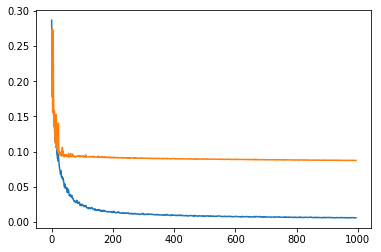

In [20]:
plt.plot(callback_list[1].history['train_loss'][5:])
plt.plot(callback_list[1].history['val_loss'][5:])

In [21]:
checkpoint = torch.load('../results/cnnnet/checkpoint.pth-best.tar')

## Loading the best model

In [22]:
from cpe775.utils.img_utils import show_landmarks_batch

In [23]:
best_model = Model(CNNNet((1, 256, 256), (68, 2)))
best_net = model.net
best_net.load_state_dict(checkpoint['state_dict'])

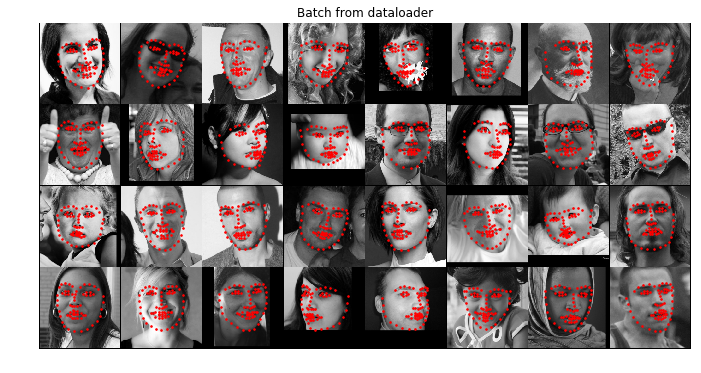

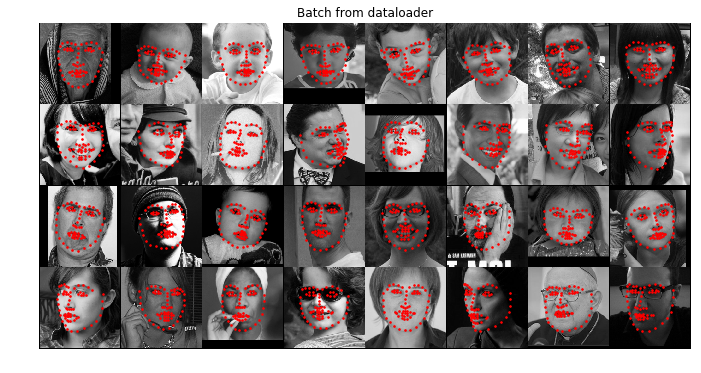

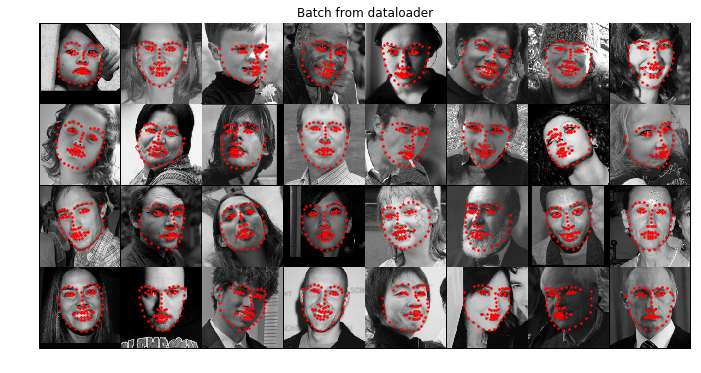

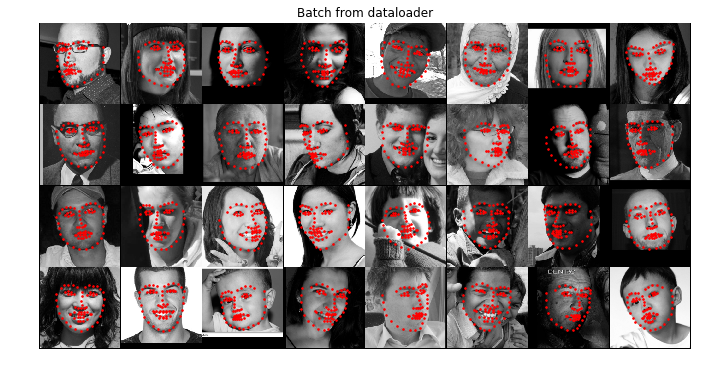

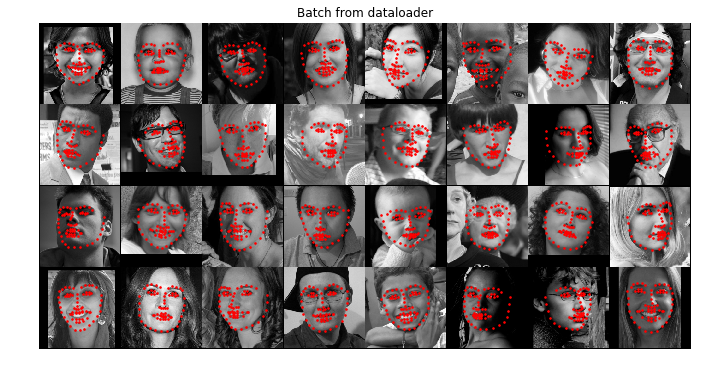

...

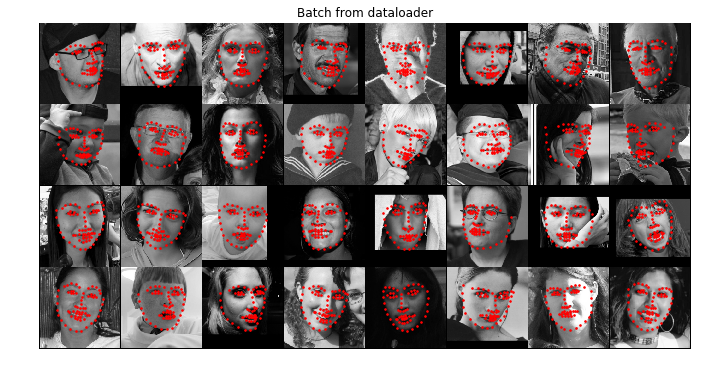

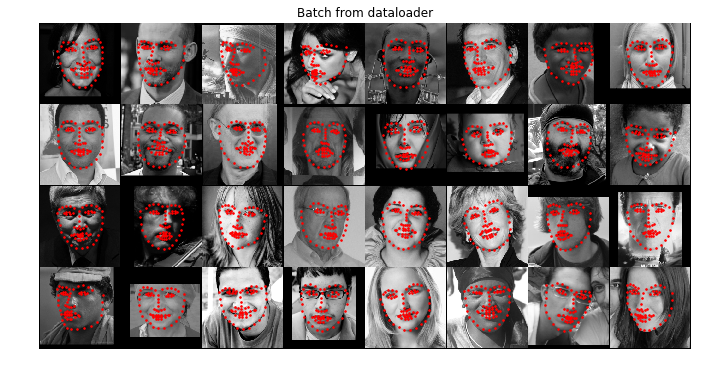

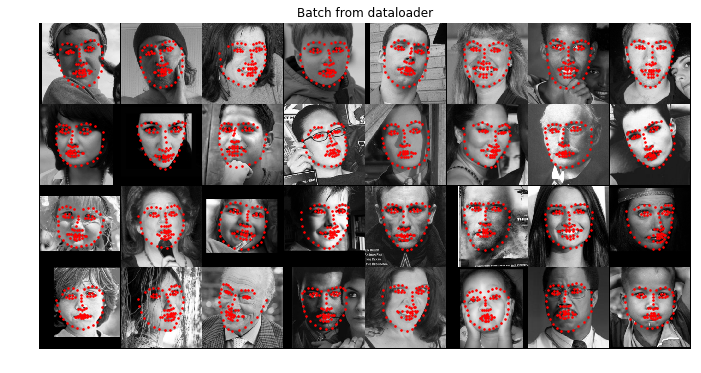

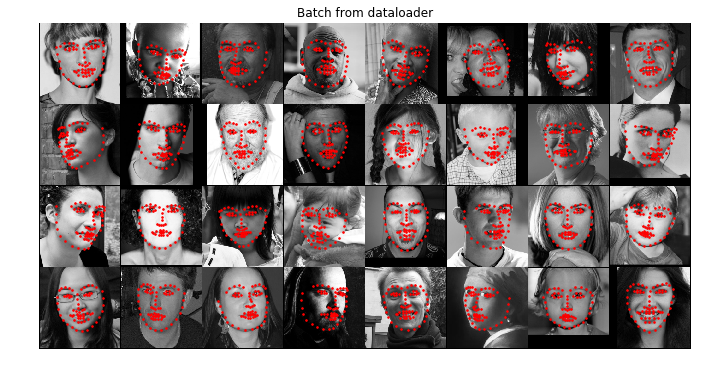

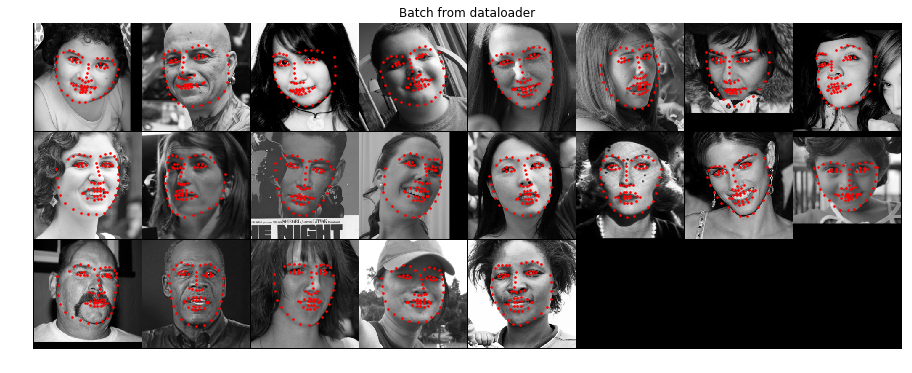

In [24]:
for i_batch, sample_batched in enumerate(valid_loader):
    
    predicted_landmarks = best_net(torch.autograd.Variable(sample_batched['image'], volatile=False)).cpu().data
    plt.figure(figsize=(20,6))
    show_landmarks_batch({'image': sample_batched['image'], 'landmarks': predicted_landmarks})
    plt.axis('off')
    plt.ioff()
    plt.show()

### Common test

In [25]:
transforms = Compose([
                   CropFace(),
                   ToGray(),
                   ToTensor()
                 ])

In [26]:
# load the dataset
dataset = FaceLandmarksDataset(csv_file='../data/common_test.csv',
                               root_dir='../data/',
                               transform=transforms)

common_loader = torch.utils.data.DataLoader(dataset, 
                batch_size=batch_size, num_workers=4)

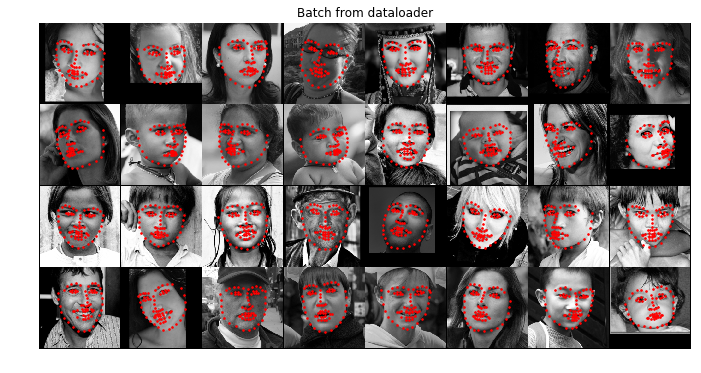

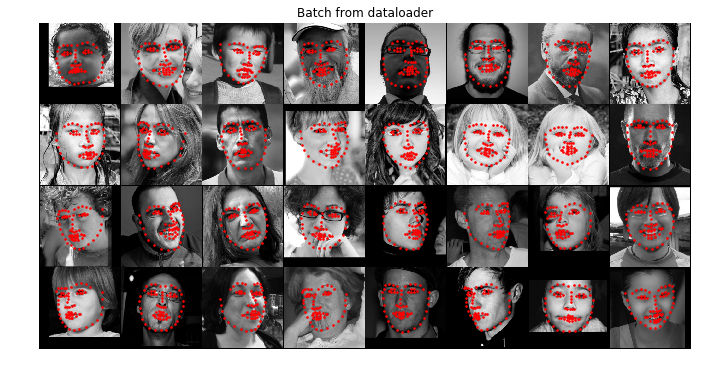

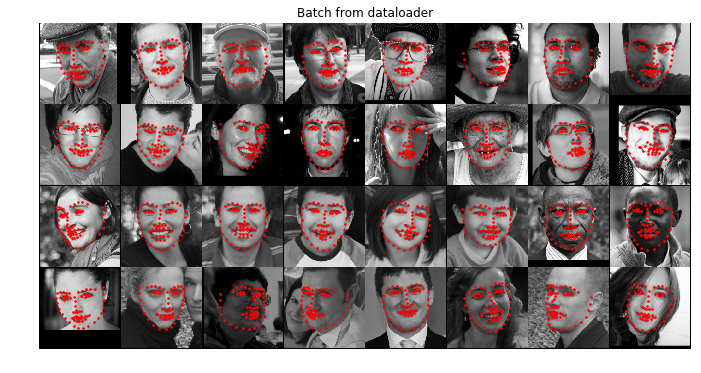

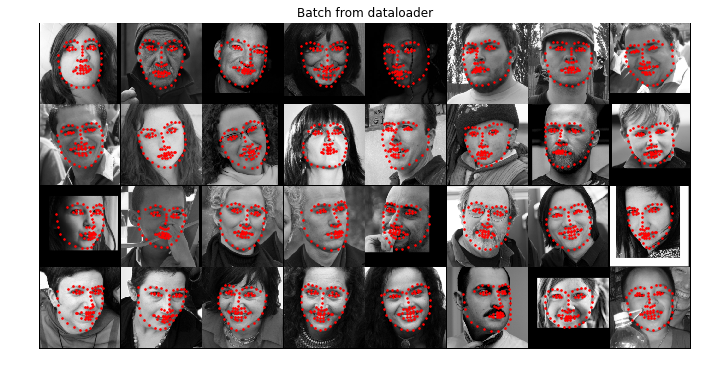

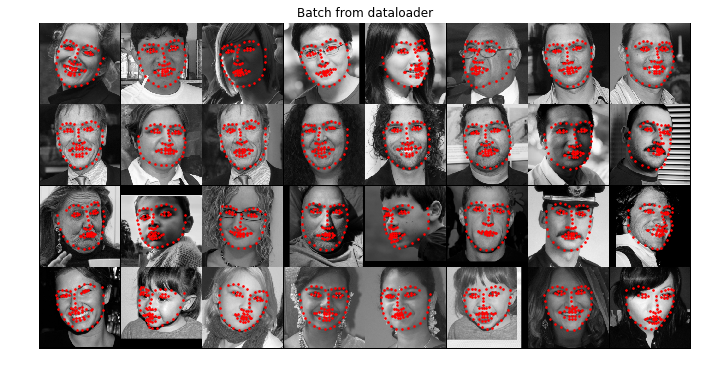

...

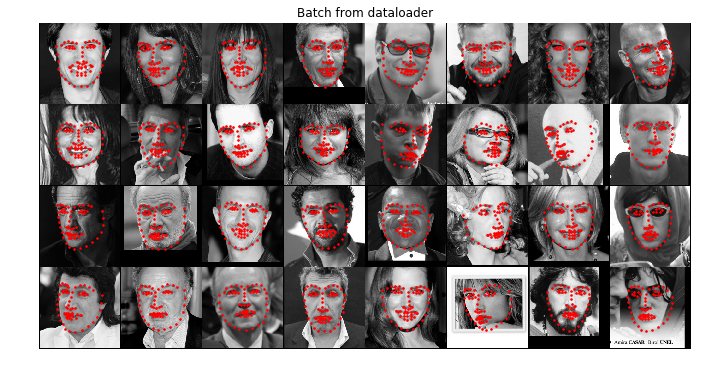

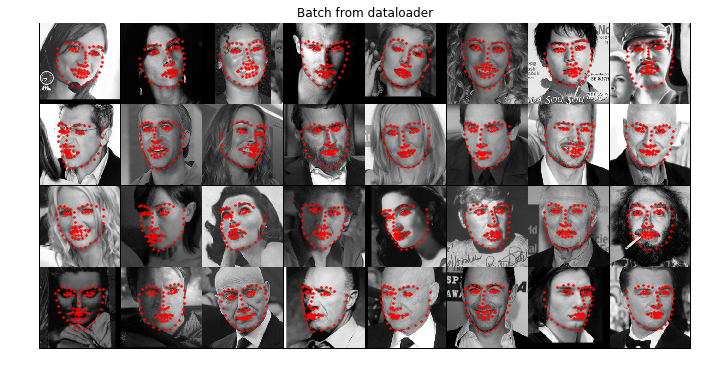

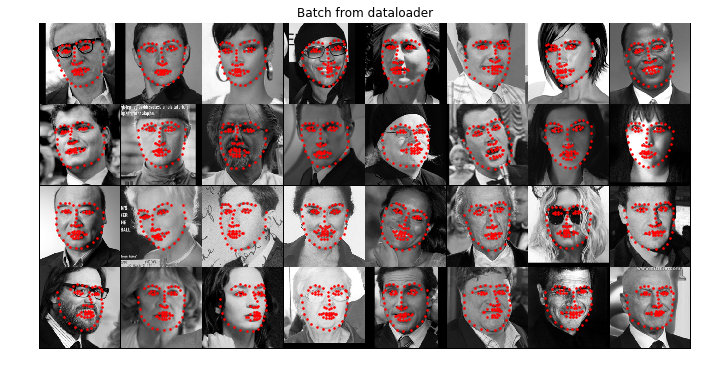

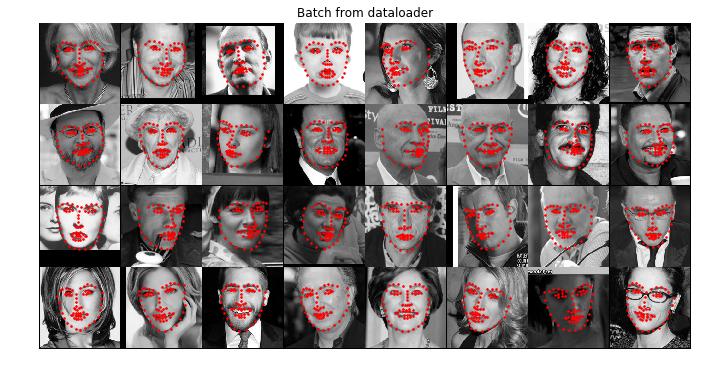

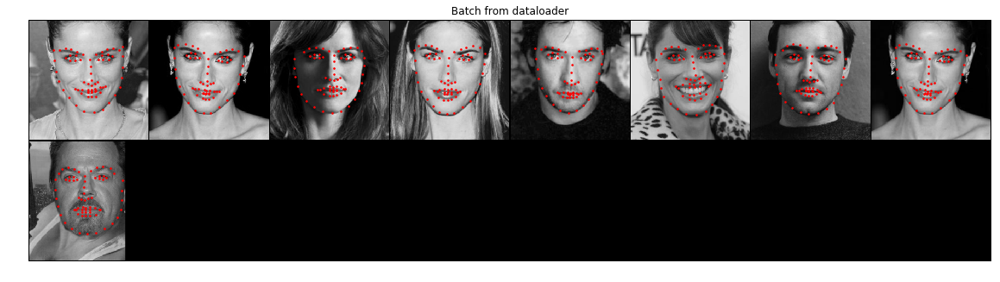

In [27]:
loss = 0
for i_batch, sample_batched in enumerate(common_loader):
    
    predicted_landmarks = best_net(torch.autograd.Variable(sample_batched['image'], volatile=False)).cpu().data
    
    loss += predicted_landmarks.shape[0]*criterion(predicted_landmarks, sample_batched['landmarks'])
    
    plt.figure(figsize=(20,6))
    show_landmarks_batch({'image': sample_batched['image'], 'landmarks': predicted_landmarks})
    plt.axis('off')
    plt.ioff()
    plt.show()

In [28]:
loss/len(dataset)

0.08038579572874642

### Challenging test

In [29]:
# load the dataset
challenging_set = FaceLandmarksDataset(csv_file='../data/challenging_test.csv',
                               root_dir='../data/',
                               transform=transforms)

challeging_loader = torch.utils.data.DataLoader(challenging_set, 
                batch_size=batch_size, num_workers=4)

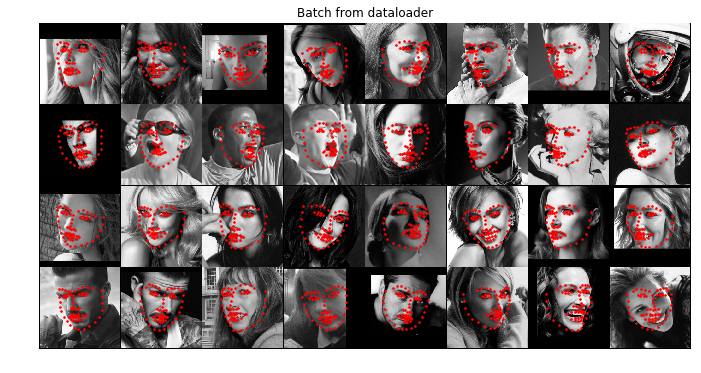

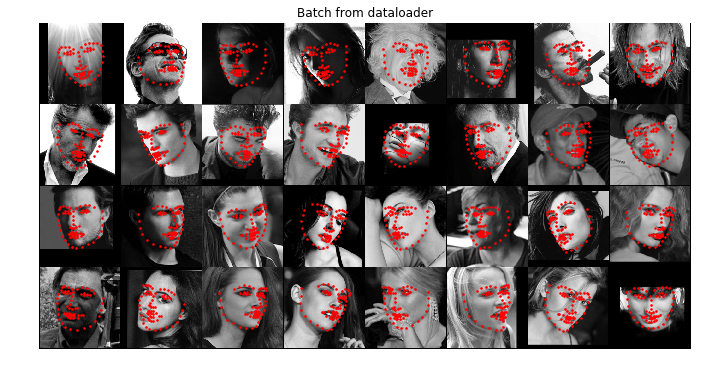

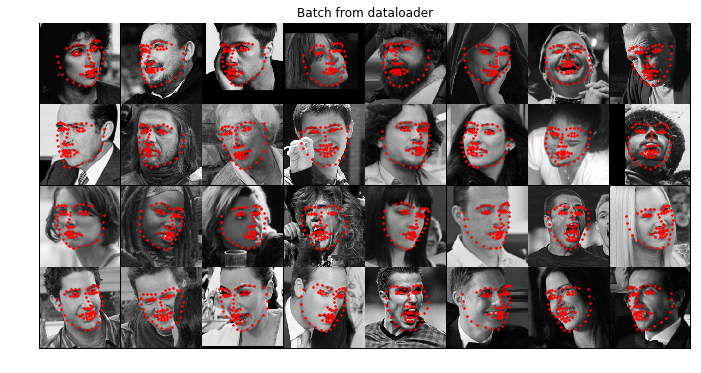

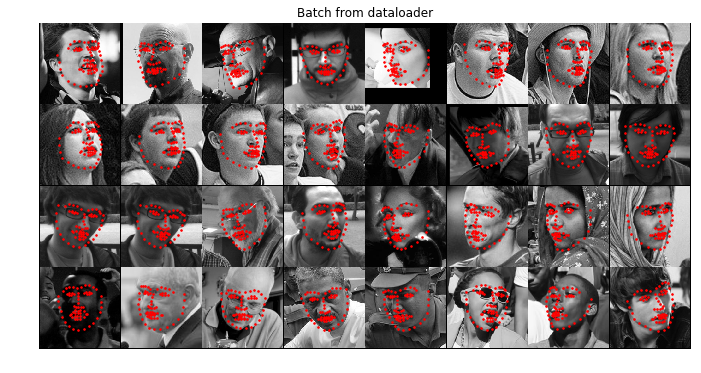

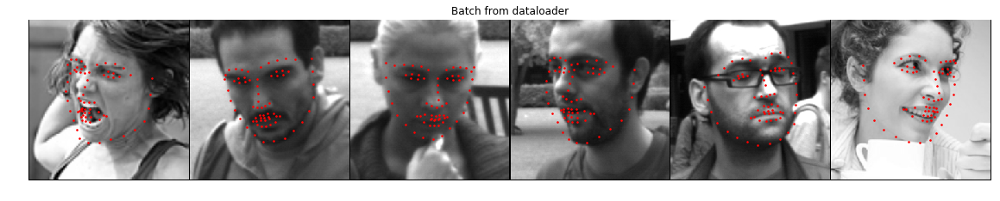

In [30]:
loss = 0
for i_batch, sample_batched in enumerate(challeging_loader):
    
    predicted_landmarks = best_net(torch.autograd.Variable(sample_batched['image'], volatile=False)).cpu().data
    
    loss += predicted_landmarks.shape[0]*criterion(predicted_landmarks, sample_batched['landmarks'])
    
    plt.figure(figsize=(20,6))
    show_landmarks_batch({'image': sample_batched['image'], 'landmarks': predicted_landmarks})
    plt.axis('off')
    plt.ioff()
    plt.show()

In [31]:
loss/len(challenging_set)

0.20401234860851694